In [66]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [67]:
!pip install keybert
!pip install spacy
!pip install flair

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [68]:
fname = "/content/drive/My Drive/Bert/kazakhstan.txt"

In [69]:
with open(fname, 'r') as f:
    data = f.read().replace('\n', ' ')

In [70]:
data

'Dear Compatriots!  Dear deputies, members of the Government!  In accordance with Article 59 of the Constitution of the Republic of Kazakhstan, I declare the third session of the Parliament of the 7th convocation open.   Dear deputies!  I congratulate everyone on the start of another session of the Parliament!   This year our country has entered a new stage of development.  In a nationwide referendum, the majority of citizens supported the course of political modernisation. The constitutional reform was a fundamental step in the creation of the New Fair Kazakhstan.  The continuation of political modernisation should be structural economic transformation.  We are facing a profound restructuring of relations in the triad “citizen – business – state”.  First and foremost, the state will ensure equality of opportunities and justice for all.  A high level of public welfare and support for socially vulnerable categories of the population, including citizens with special needs, will be guaran

In [74]:
from keybert import KeyBERT

doc = data
model = KeyBERT("all-MiniLM-L6-v2")
keywords = model.extract_keywords(doc, top_n=10)

# # You can set keyphrase_ngram_range to set the length of the resulting keywords/keyphrases:
# model.extract_keywords(doc, keyphrase_ngram_range=(1, 1), stop_words=None)
#
# # To extract keyphrases, simply set keyphrase_ngram_range to (1, 2) or higher depending on the number of words you would like in the  keyphrases:
keywords0 = model.extract_keywords(doc, keyphrase_ngram_range=(1, 1), stop_words=None, top_n=10)

# NOTE: For a full overview of all possible transformer models see sentence-transformer. I would advise either 'distilbert-base-nli-mean-tokens'
# or 'xlm-r-distilroberta-base-paraphrase-v1' as they have shown great performance in semantic similarity and paraphrase identification respectively.



In [ ]:
# 2.3. Max Sum Similarity
# To diversity the results, we take the 2 x top_n most similar words/phrases to the document. Then, we take all top_n combinations from the 2 x top_n
# words and extract the combination that are the least similar to each other by cosine similarity.
keywords1 = model.extract_keywords(doc, keyphrase_ngram_range=(3, 3), stop_words='english', use_maxsum=True, nr_candidates=20, top_n=5)

In [ ]:
# 2.4. Maximal Marginal Relevance
# To diversify the results, we can use Maximal Margin Relevance (MMR) to create keywords / keyphrases which is also based on cosine similarity.
# The results with high diversity:

keywords2 = model.extract_keywords(doc, keyphrase_ngram_range=(3, 3), stop_words='english', use_mmr=True, diversity=0.7, top_n=5)

In [57]:
# 2.5. Embedding Models
# The parameter model takes in a string pointing to a sentence-transformers model, a SentenceTransformer, or a Flair DocumentEmbedding model.
#
# Sentence-Transformers
# You can select any model from sentence-transformers here and pass it through KeyBERT with model:
model = KeyBERT(model='distilbert-base-nli-mean-tokens')
keywords3 = model.extract_keywords(doc, keyphrase_ngram_range=(3, 3), stop_words='english', use_maxsum=True, nr_candidates=20, top_n=5)

In [58]:
# Or select a SentenceTransformer model with your own parameters:
from sentence_transformers import SentenceTransformer

sentence_model = SentenceTransformer("distilbert-base-nli-mean-tokens", device="cpu")
model = KeyBERT(model=sentence_model)
keywords3 =  model.extract_keywords(doc, keyphrase_ngram_range=(3, 3), stop_words='english', use_maxsum=True, nr_candidates=20, top_n=5)

In [63]:
# Flair allows you to choose almost any embedding model that is publicly available. Flair can be used as follows:
from flair.embeddings import TransformerDocumentEmbeddings

roberta = TransformerDocumentEmbeddings('roberta-base')
model = KeyBERT(model=roberta)
keywords4 = model.extract_keywords(doc, keyphrase_ngram_range=(1, 1), stop_words=None, use_maxsum=True, nr_candidates=20, top_n=10)

In [60]:
# # To use Spacy's non-transformer models in KeyBERT:
# import spacy
#
# nlp = spacy.load("en_core_web_md", exclude=['tagger', 'parser', 'ner', 'attribute_ruler', 'lemmatizer'])
# model = KeyBERT(model=document_glove_embeddings_nlp)


# Using spacy-transformer models:
import spacy

spacy.prefer_gpu()
nlp = spacy.load("en_core_web_sm", exclude=['tagger', 'parser', 'ner', 'attribute_ruler', 'lemmatizer'])
model = KeyBERT(model=nlp)
keywords5 = model.extract_keywords(doc, keyphrase_ngram_range=(1, 1), stop_words= None, use_maxsum=True, nr_candidates=20, top_n=10)

print("End")



End


In [ ]:
keywords

In [75]:
keywords0

[('reforms', 0.4567),
 ('kazakhstan', 0.4107),
 ('republic', 0.4029),
 ('kazakh', 0.3934),
 ('reform', 0.3927),
 ('constitutional', 0.371),
 ('kazakhs', 0.369),
 ('constitution', 0.3619),
 ('referendum', 0.3524),
 ('restructuring', 0.3517)]

In [79]:
keywords1

[('presidential election shortening', 0.4187),
 ('parliamentary election 2025', 0.44),
 ('new fair kazakhstan', 0.4453),
 ('nationwide referendum majority', 0.4677),
 ('construction fair kazakhstan', 0.4812)]

In [64]:
keywords4

[('professionals', 0.9922),
 ('professional', 0.9922),
 ('businesses', 0.9922),
 ('concentrated', 0.9922),
 ('decentralising', 0.9922),
 ('legislation', 0.9922),
 ('institution', 0.9922),
 ('neutralize', 0.9922),
 ('the', 0.9922),
 ('sectoral', 0.9927)]

In [10]:
keywords5

[('the', 0.3216),
 ('amanat', 0.3235),
 ('circulation', 0.3291),
 ('money', 0.3297),
 ('punishment', 0.3339),
 ('institution', 0.3436),
 ('infant', 0.3443),
 ('school', 0.3476),
 ('modernisation', 0.3484),
 ('system', 0.3527)]

In [11]:
keywords6 = model.extract_keywords(doc, keyphrase_ngram_range=(1, 2), stop_words= None, use_maxsum=True, nr_candidates=20, top_n=10)

In [13]:
keywords6

[('bureaucratic system', 0.4733),
 ('rural cooperation', 0.4736),
 ('artificial division', 0.4766),
 ('of neighbouring', 0.4771),
 ('of innovation', 0.4802),
 ('basic factor', 0.4821),
 ('major oil', 0.4828),
 ('by human', 0.4874),
 ('by the', 0.4942),
 ('by private', 0.5003)]

In [81]:
stop_words = 
keywords7 = model.extract_keywords(doc, keyphrase_ngram_range=(3, 3), stop_words= 'of', 'the', 'for', 'between', use_maxsum=True, nr_candidates=20, top_n=10)

AttributeError: ignored

In [15]:
keywords7

[('between the age', 0.5934),
 ('under the government', 0.5935),
 ('participation in the', 0.5936),
 ('selection by the', 0.5956),
 ('of the system', 0.5997),
 ('of social structure', 0.6004),
 ('by the state', 0.6007),
 ('at technological modernisation', 0.6035),
 ('of administrative pressure', 0.6072),
 ('for political system', 0.6133)]

In [29]:
countOfWords = len(doc.split())
print("Count of Words in the given Sentence:", countOfWords)

Count of Words in the given Sentence: 8106


In [30]:
import numpy as np  # useful for many scientific computing in Python
import pandas as pd # primary data structure library
from PIL import Image # converting images into arrays
import matplotlib.pyplot as plt # for visualizing the data

In [31]:
!pip install wordcloud

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [32]:
from wordcloud import WordCloud, STOPWORDS

In [34]:
stopwords = set(STOPWORDS)
# instantiate a word cloud object
alice_wc = WordCloud(
    background_color='white',
    max_words=2000,
    stopwords=stopwords
)
# generate the word cloud
alice_wc.generate(doc)

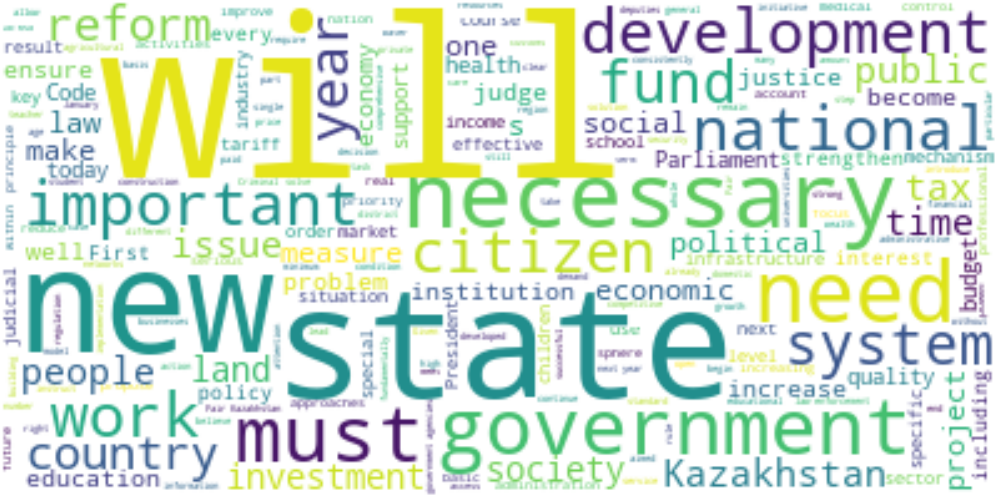

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [47]:
import matplotlib.pyplot as plt
# display the word cloud
plt.figure(figsize=(150, 100))
plt.imshow(alice_wc, interpolation='bilinear')
plt.axis('off')

plt.savefig('hellya.png')
plt.show()
from google.colab import files
files.download("hellya.png") 